<a href="https://colab.research.google.com/github/Sujitqwert/DV-case-study-2/blob/main/Bicycle_lane.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -U googlemaps
!pip install osmnx geopandas matplotlib
!pip install folium

  Preparing metadata (setup.py) ... done
  Created wheel for googlemaps: filename=googlemaps-4.10.0-py3-none-any.whl size=40711 sha256=9603655d7dbd7fc4775c5260eb73f9986d05663f93a7bab446d8f6ef65281f40
  Stored in directory: /root/.cache/pip/wheels/17/f8/79/999d5d37118fd35d7219ef57933eb9d09886c4c4503a800f84
Successfully built googlemaps
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.4/102.4 kB 2.9 MB/s eta 0:00:00
/bin/bash: line 1: pip install folium: command not found


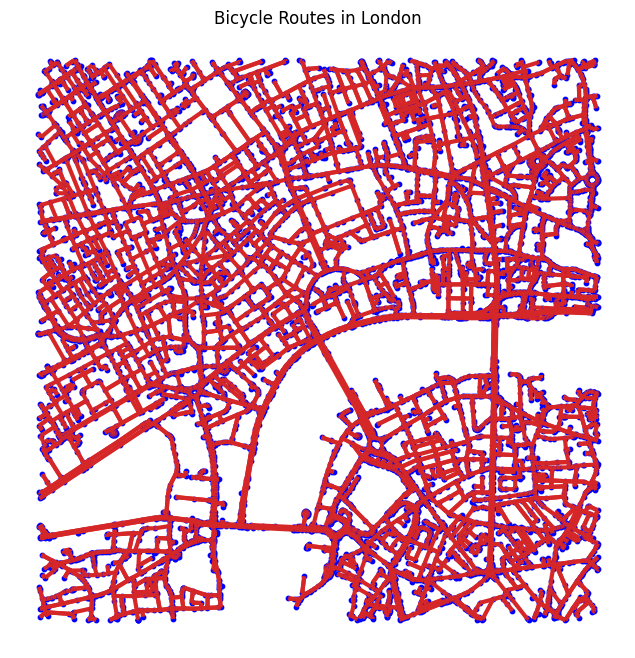

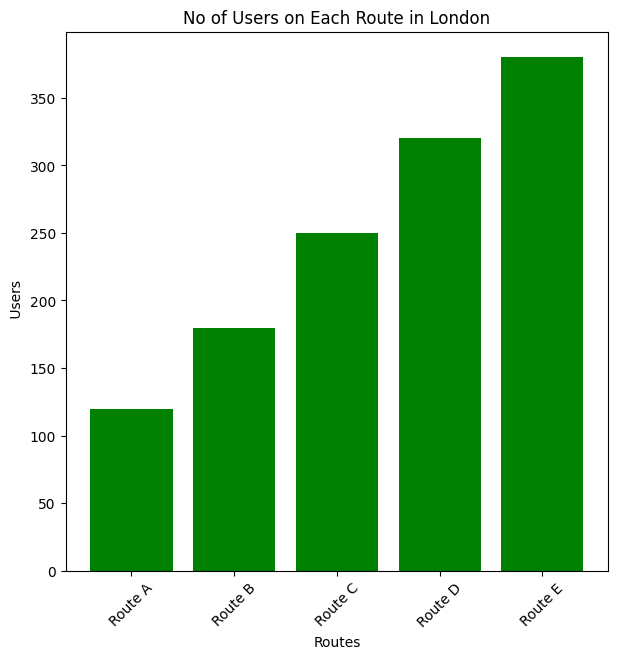

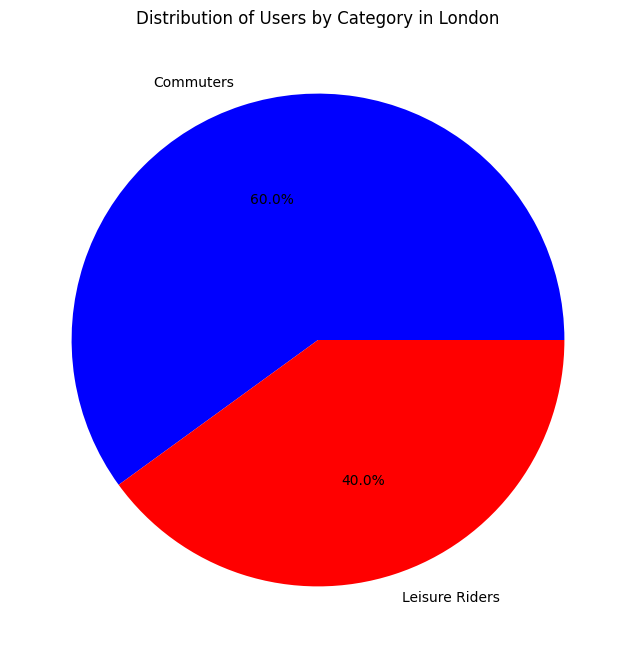

In [3]:
import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt
import folium

# Specify London's coordinates (latitude and longitude)
latitude_london = 51.509865  # Latitude of a location in London
longitude_london = -0.118092  # Longitude of a location in London

# Download the bicycle network data for the specified location in London
G_london = ox.graph_from_point((latitude_london, longitude_london), dist=1500, network_type='bike', simplify=False)

# Create nodes and edges GeoDataFrames and fill in all edge geometry attributes
nodes_london, edges_london = ox.graph_to_gdfs(G_london, nodes=True, edges=True)

# Plot the bicycle routes in London
fig, ax = plt.subplots(figsize=(12, 8))
edges_london.plot(ax=ax, linewidth=3, edgecolor='tab:red')
nodes_london.plot(ax=ax, markersize=10, color='blue')
plt.title('Bicycle Routes in London')
plt.axis('off')
plt.show()

# Sample route data with user counts for London
route_names_london = ['Route A', 'Route B', 'Route C', 'Route D', 'Route E']
user_counts_london = [120, 180, 250, 320, 380]

# Sample user category data for London
user_categories_london = ['Commuters', 'Leisure Riders', 'Commuters', 'Leisure Riders', 'Commuters']

# Bar chart: Number of users on each route in London
plt.figure(figsize=(7, 7))
plt.bar(route_names_london, user_counts_london, color='green')
plt.xlabel('Routes')
plt.ylabel(' Users')
plt.title('No of Users on Each Route in London')
plt.xticks(rotation=45)
plt.show()

# Pie chart: Distribution of users by category in London
category_counts_london = {}
for category in user_categories_london:
    if category in category_counts_london:
        category_counts_london[category] += 1
    else:
        category_counts_london[category] = 1

categories_london = list(category_counts_london.keys())
category_values_london = list(category_counts_london.values())

plt.figure(figsize=(8, 8))
plt.pie(category_values_london, labels=categories_london, autopct='%1.1f%%', colors=['blue', 'red'])
plt.title('Distribution of Users by Category in London')
plt.show()

# Define the coordinates of restricted places in London
restricted_places_london = [
    {'name': 'Hotel London', 'location': [51.509865, -0.118092]},
    {'name': 'Cafe Westminster', 'location': [51.5014, -0.1247]},
    # Add more restricted places and their coordinates in London here
]

# Mark restricted places on the map in London
m_london = folium.Map(location=[latitude_london, longitude_london], zoom_start=15)

for place in restricted_places_london:
    folium.Marker(
        location=place['location'],
        popup=place['name'],
        icon=folium.Icon(color='red')
    ).add_to(m_london)

# Display the map with restricted places in London
m_london

# Add the bicycle routes as a GeoJSON layer in the London map
m_london = folium.Map(location=[latitude_london, longitude_london], zoom_start=15)
edges_geojson_london = edges_london.to_crs(epsg=4326).to_json()
nodes_geojson_london = nodes_london.to_crs(epsg=4326).to_json()

# Add the bicycle routes as a GeoJSON layer in London
folium.GeoJson(edges_geojson_london, name='Bicycle Lane Distribution', style_function=lambda x: {'color': 'blue', 'weight': 2}).add_to(m_london)

# Display the map with bicycle routes in London
m_london
